<a href="https://colab.research.google.com/github/issmirka/House-Price-Prediction/blob/main/House_Price_Prediction_C.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Intro

**Project goal:** : Predicting house prices in Moscow


---


**Research questions:**

*   Which factors have the greatest impact on housing prices?
*   Is there a correlation between priximity to metro stations and housing prices?
*   Can we identify any non-linear relationships between factors and housing prices?
*   How do newly constructed apartments affect the price?
*   Are there any preferences regarding floor levels?
*   In which region are the most expensive apartments?


---


**Null Hypothesis:** No linear relationship between the house price and the variables

**Alternative Hypothesis:** There is a significant linear relationship between the house price and the variables


---


**Methods:** Linear Regression, Decision Tree Regressor, Random Forest Regressor


#About Dataset

This dataset comes from https://www.kaggle.com/datasets/ivan314sh/prices-of-moscow-apartments/data and contains information about Moscow houses that was collected on 2024-04-25.

---


**Columns Description**




**Price:** The price of the property in the specified currency (RUB).

**Min_to_metro:** The time in minutes required to walk from the property to the nearest metro station.

**Region_of_moscow:** The administrative region of Moscow where the property is located.

**Total_area:** The total floor area of the property in square meters.

**Living_area:** The living area of the property in square meters, indicating the space specifically designated for living purposes.

**Floor:** The floor on which the property is located.

**Number_of_floors:** The total number of floors in the building where the property is located.

**Construction_year**: The year in which the property was constructed.

**Is_new:** A binary indicator (yes/no or 0/1) specifying whether the property is newly constructed.

**Is_apartments:** A binary indicator (yes/no or 1/0) specifying whether the property is classified as an apartment. (In Russia you can be legally registered in a property that is suited for living, for legal purposes some apartments are perfectly comfortable to live in, but you can't be registered there because there are no schools nearby or something else) The apartments where you can register are labeled 0, where you can not 1.

**Ceiling_height:** The height of the ceiling in the property, measured in meters.

**Number_of_rooms:** The total number of rooms in the apartment, including bedrooms, living rooms, etc.

**Link:** The URL link to access more details or information about the property online.



---


**Explanation of region area shortcut:**

1.Central Administrative region (CAR)

2.Northern Administrative region (NAR)

3.North-Eastern Administrative region (NEAR)

4.Eastern Administrative region (EAR)

5.South-Eastern Administrative region (SEAR)

6.Southern Administrative region (SAR)

7.South-Western Administrative region (SWAR)

8.Western Administrative region (WAR)

9.North-Western Administrative region (NWAR)

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

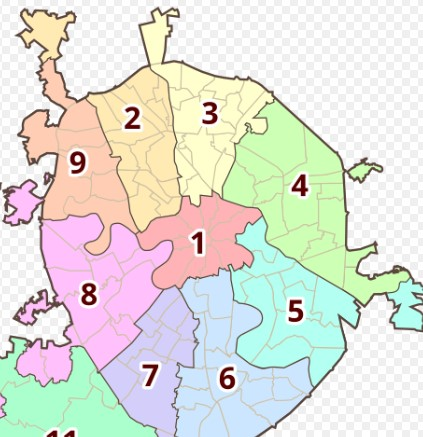

In [ ]:
img_path = "/content/Zrzut ekranu 2024-06-19 213106.jpg"
img = cv2.imread(img_path)
cv2_imshow(img)

# Importing Libraries and Loading Data

In [ ]:
%pip install ydata_profiling

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import seaborn as sns
from datetime import date, datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from yellowbrick.regressor import PredictionError
import graphviz
import yfinance as yf
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [ ]:
df = pd.read_csv("/content/moscow_flats_dataset_eng.csv")

# Understanding the Dataset

In [ ]:
# first 10 rows and columns view

In [ ]:
df.head(10)

,price,min_to_metro,region_of_moscow,total_area,living_area,floor,number_of_floors,construction_year,is_new,is_apartments,ceiling_height,number_of_rooms,link
0,31633073.0,24.0,SAR,64.20,32.4,11.0,16.0,2023.0,1.0,0.0,3.15,2.0,https://www.cian.ru/sale/flat/293204033/
1,29293000.0,9.0,NEAR,78.10,NaN,9.0,27.0,2022.0,1.0,0.0,NaN,2.0,https://www.cian.ru/sale/flat/294033524/
2,30349669.0,5.0,SAR,72.40,33.6,3.0,24.0,2023.0,1.0,0.0,3.15,2.0,https://www.cian.ru/sale/flat/300712697/
3,31845511.0,19.0,SAR,69.20,NaN,2.0,12.0,2024.0,1.0,0.0,2.97,2.0,https://www.cian.ru/sale/flat/300228448/
4,38810000.0,27.0,WAR,66.90,24.8,9.0,14.0,2023.0,1.0,0.0,3.00,2.0,https://www.cian.ru/sale/flat/299262105/
5,85004500.0,8.0,CAR,104.30,NaN,6.0,7.0,2016.0,1.0,1.0,3.25,2.0,https://www.cian.ru/sale/flat/263389572/
6,82644000.0,3.0,CAR,85.20,NaN,52.0,66.0,2020.0,1.0,1.0,3.90,2.0,https://www.cian.ru/sale/flat/296913134/
7,34100453.0,20.0,SAR,66.00,29.9,8.0,46.0,2023.0,1.0,0.0,3.00,2.0,https://www.cian.ru/sale/flat/299093558/
8,27447668.0,5.0,SAR,65.55,34.4,26.0,26.0,2023.0,1.0,0.0,2.87,2.0,https://www.cian.ru/sale/flat/290283240/
9,21230289.0,5.0,WAR,59.30,29.3,23.0,23.0,2023.0,1.0,0.0,2.73,2.0,https://www.cian.ru/sale/flat/298525427/


In [ ]:
# number of data in columns and their types
# two columns contain the object data type, the rest are float

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6983 entries, 0 to 6982
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   price              6961 non-null   float64
 1   min_to_metro       6846 non-null   float64
 2   region_of_moscow   6892 non-null   object 
 3   total_area         6960 non-null   float64
 4   living_area        4514 non-null   float64
 5   floor              6960 non-null   float64
 6   number_of_floors   6960 non-null   float64
 7   construction_year  5761 non-null   float64
 8   is_new             6949 non-null   float64
 9   is_apartments      6949 non-null   float64
 10  ceiling_height     5053 non-null   float64
 11  number_of_rooms    6983 non-null   float64
 12  link               6983 non-null   object 
dtypes: float64(11), object(2)
memory usage: 709.3+ KB


In [ ]:
#statistical description of columns

In [ ]:
df.describe()

,price,min_to_metro,total_area,living_area,floor,number_of_floors,construction_year,is_new,is_apartments,ceiling_height,number_of_rooms
count,6.961000e+03,6846.000000,6960.000000,4514.000000,6960.000000,6960.000000,5761.000000,6949.000000,6949.000000,5053.000000,6983.000000
mean,5.991086e+07,13.183465,84.139886,44.932455,10.519540,19.541379,2003.237806,0.267377,0.156569,3.035529,2.480596
std,9.353880e+07,77.163524,51.826896,30.813177,10.637918,14.456480,28.491038,0.442622,0.363420,0.714796,1.084983
min,8.000000e+05,1.000000,9.000000,1.000000,-1.000000,1.000000,1820.000000,0.000000,0.000000,2.000000,1.000000
25%,1.650000e+07,6.000000,45.000000,20.625000,4.000000,9.000000,1987.000000,0.000000,0.000000,2.700000,2.000000
50%,3.050000e+07,9.000000,70.850000,37.500000,7.000000,16.000000,2019.000000,0.000000,0.000000,3.000000,2.000000
75%,6.300000e+07,14.000000,106.100000,60.000000,14.000000,25.000000,2023.000000,1.000000,0.000000,3.150000,3.000000
max,3.737636e+09,2025.000000,530.000000,350.000000,80.000000,95.000000,2027.000000,1.000000,1.000000,30.000000,4.000000


In [ ]:
df.describe(include=['object'])

,region_of_moscow,link
count,6892,6983
unique,9,6977
top,CAR,https://www.cian.ru/sale/flat/299810301/
freq,1663,2


In [ ]:
#checking the number of missing values in each column

In [ ]:
missing_values = df.isna().sum()

Text(0.5, 1.0, 'Number of missing values in each column')

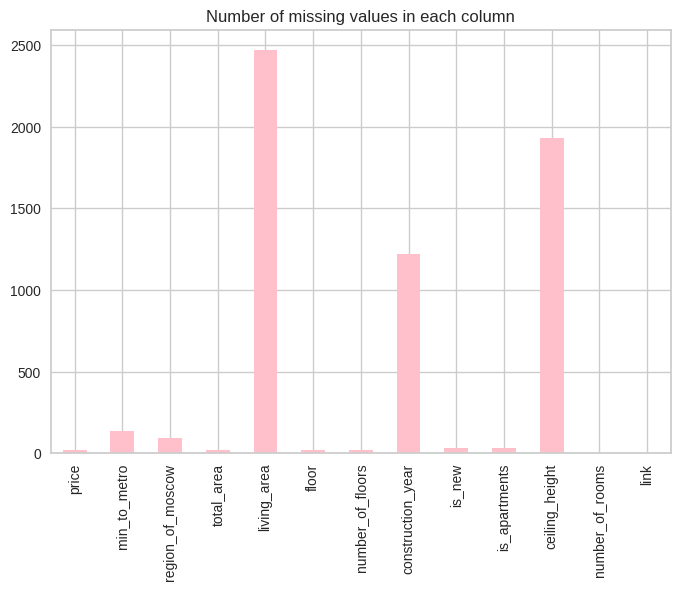

In [ ]:
missing_values.plot(kind='bar', color='pink')
plt.title('Number of missing values in each column')

In [ ]:
#checking correlation and all necessary information from the report

In [ ]:
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#checking outliers

<Axes: >

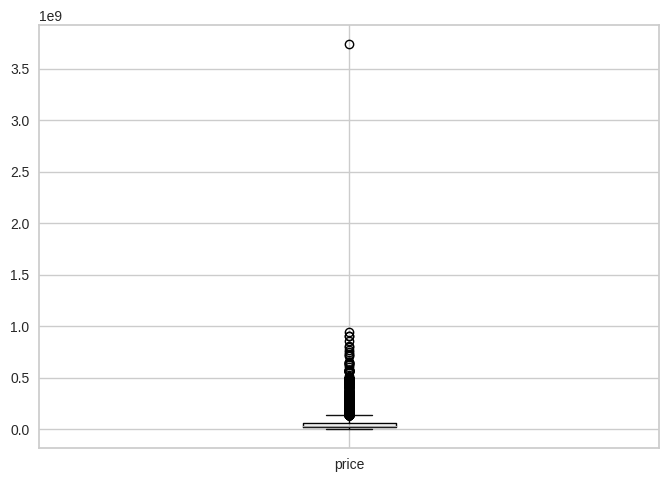

In [ ]:
df.boxplot(['price'])

In [ ]:
df[df['price']>600000000]

,price,min_to_metro,region_of_moscow,total_area,living_area,floor,number_of_floors,construction_year,is_new,is_apartments,ceiling_height,number_of_rooms,link
3968,6.479242e+08,6.0,CAR,343.60,NaN,5.0,5.0,2019.0,1.0,0.0,3.6,3.0,https://www.cian.ru/sale/flat/294880595/
4155,9.047844e+08,8.0,CAR,198.80,75.6,3.0,5.0,2023.0,1.0,0.0,3.0,3.0,https://www.cian.ru/sale/flat/299563199/
5021,9.409220e+08,7.0,CAR,303.90,NaN,12.0,12.0,NaN,0.0,0.0,NaN,3.0,https://www.cian.ru/sale/flat/275848068/
5197,7.056915e+08,4.0,CAR,203.10,NaN,6.0,7.0,NaN,0.0,0.0,3.4,3.0,https://www.cian.ru/sale/flat/291067078/
5376,6.500000e+08,13.0,CAR,251.80,NaN,4.0,4.0,2021.0,1.0,0.0,NaN,4.0,https://www.cian.ru/sale/flat/296119409/
5520,9.034064e+08,9.0,CAR,460.10,NaN,21.0,21.0,2023.0,1.0,0.0,3.0,4.0,https://www.cian.ru/sale/flat/272290927/
5544,7.231974e+08,14.0,CAR,458.30,NaN,8.0,8.0,2023.0,1.0,0.0,3.2,4.0,https://www.cian.ru/sale/flat/294775310/
5680,7.475272e+08,5.0,CAR,227.00,109.7,3.0,7.0,2017.0,0.0,0.0,NaN,4.0,https://www.cian.ru/sale/flat/296186591/
5768,7.253000e+08,7.0,CAR,366.80,197.0,4.0,7.0,2016.0,0.0,0.0,3.6,4.0,https://www.cian.ru/sale/flat/299060923/
5785,6.200000e+08,13.0,CAR,355.00,NaN,4.0,4.0,2021.0,0.0,0.0,NaN,4.0,https://www.cian.ru/sale/flat/299645497/


## Conlusion


1. Dataset contains missing and duplicated values that need to be removed or replaced.
2. The *links* column is not needed for further analysis.
3. The *price* column can be converted to USD currency.
4. The *construction_ year* column contains a lot of missing values which is difficult to replace or estimate. Futhermore, it is not correlated with price so I decided to remove it.
5. The living area is strongly correlated with the total area. Living area contains more missing values so it should be removed.
6. Outliers can be removed.
7. Floor and Number of floors are strongly correlated, so the number of floors should be removed - is less important from a business perspective.
8.There are nineteen outliers with prices more than 700000000 RUB





# Data Cleaning

In [ ]:
#removing unnecessary columns

In [ ]:
df = df.drop(["link", "living_area", "number_of_floors", "construction_year"], axis=1)

In [ ]:
#filling in missing values with the average

In [ ]:
df['ceiling_height'].fillna(df['ceiling_height'].mean(), inplace=True)

In [ ]:
#removing missing and duplicate values

In [ ]:
df.isna().sum()

price                22
min_to_metro        137
region_of_moscow     91
total_area           23
floor                23
is_new               34
is_apartments        34
ceiling_height        0
number_of_rooms       0
dtype: int64

In [ ]:
df = df.dropna()

In [ ]:
df.duplicated().sum()

74

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df = df[df['price']<600000000]

In [ ]:
df = df[df['total_area']<300]

In [ ]:
df.shape

(6656, 9)

In [ ]:
#changing currency

In [ ]:
def exchange_rate():
    ticker = 'RUBUSD=X'
    data = yf.Ticker(ticker)
    exchange_rate = data.history(period='1d')['Close'].iloc[-1]
    print(f"Current RUB to USD exchange rate: {exchange_rate:.4f}")
    return exchange_rate

ex = exchange_rate()
df.price = df.price * ex

Current RUB to USD exchange rate: 0.0112


In [ ]:
#rename column

In [ ]:
df.rename(columns= {'price':'price_USD'}, inplace=True)

In [ ]:
df

,price_USD,min_to_metro,region_of_moscow,total_area,floor,is_new,is_apartments,ceiling_height,number_of_rooms
0,3.552282e+05,24.0,SAR,64.2,11.0,1.0,0.0,3.150000,2.0
1,3.289500e+05,9.0,NEAR,78.1,9.0,1.0,0.0,3.035529,2.0
2,3.408160e+05,5.0,SAR,72.4,3.0,1.0,0.0,3.150000,2.0
3,3.576138e+05,19.0,SAR,69.2,2.0,1.0,0.0,2.970000,2.0
4,4.358225e+05,27.0,WAR,66.9,9.0,1.0,0.0,3.000000,2.0
...,...,...,...,...,...,...,...,...,...
6978,3.313293e+05,6.0,NAR,86.1,3.0,0.0,0.0,3.035529,4.0
6979,1.347557e+06,2.0,CAR,163.5,6.0,0.0,0.0,3.000000,4.0
6980,1.852892e+06,7.0,CAR,154.0,16.0,0.0,0.0,3.035529,4.0
6981,2.414374e+05,11.0,SEAR,94.2,2.0,0.0,0.0,2.800000,4.0


# Exploratory Data Analysis

In [ ]:
# showing histogram for selected columns

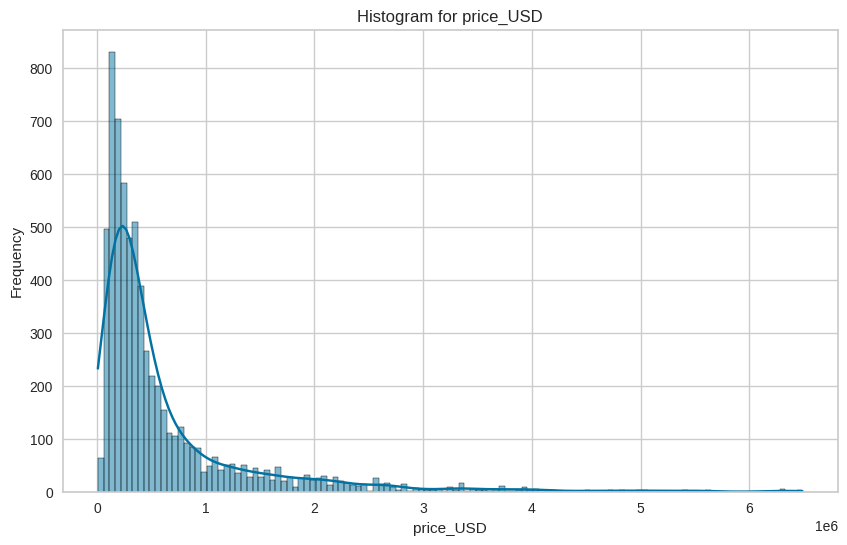

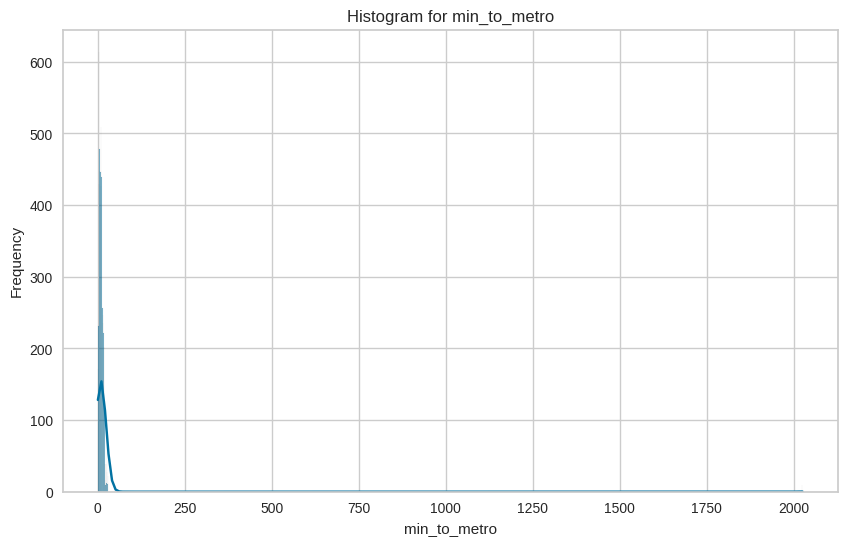

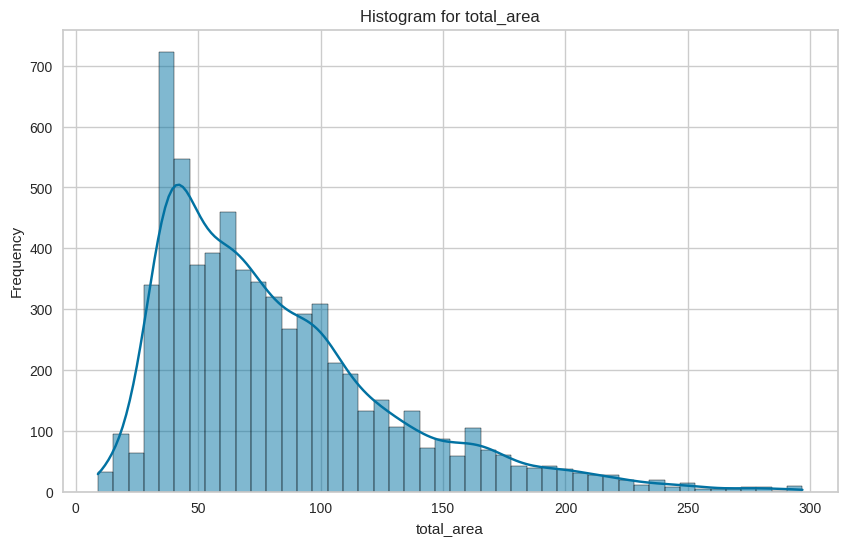

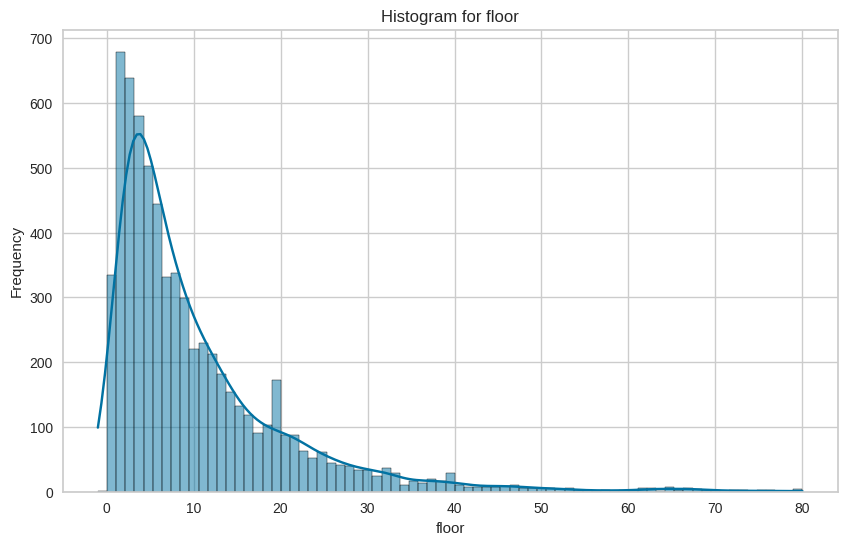

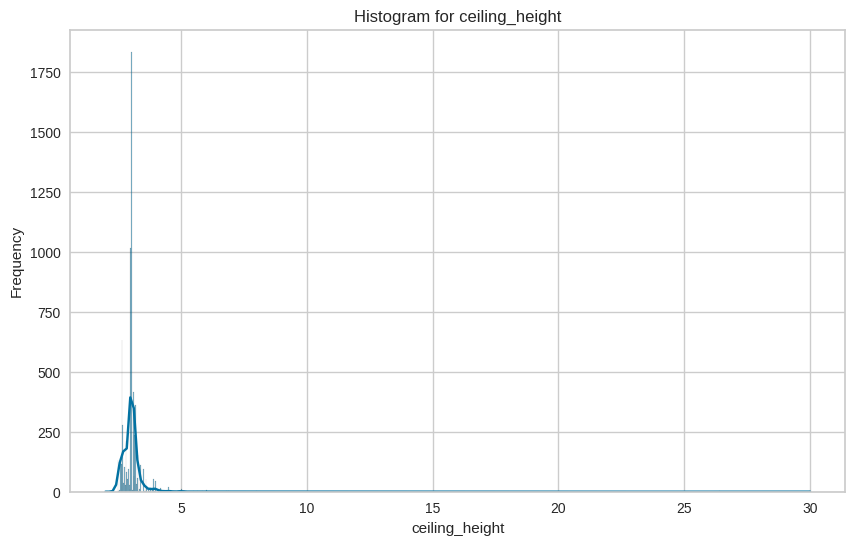

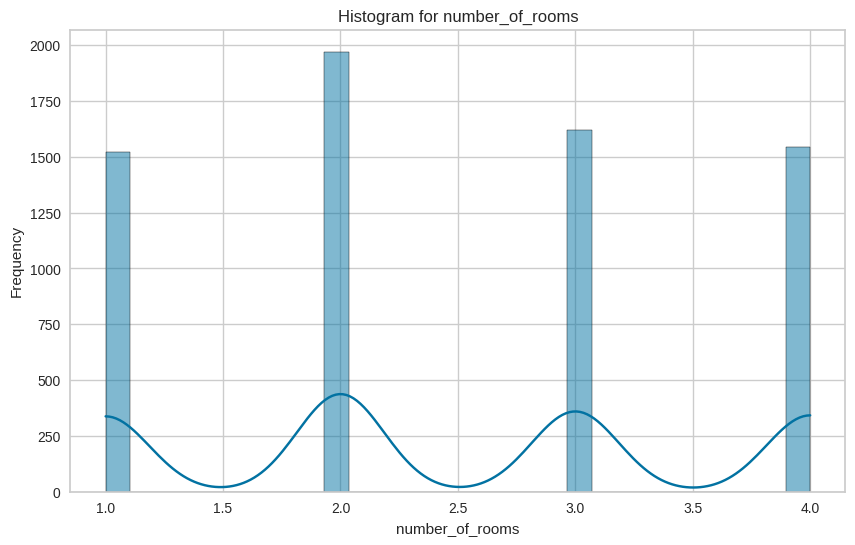

In [ ]:
important_columns = ['price_USD', 'min_to_metro', 'total_area', 'floor', 'ceiling_height', 'number_of_rooms']

for col in important_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram for {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
#showing the relationship between factors

Text(0, 0.5, 'Number of houses')

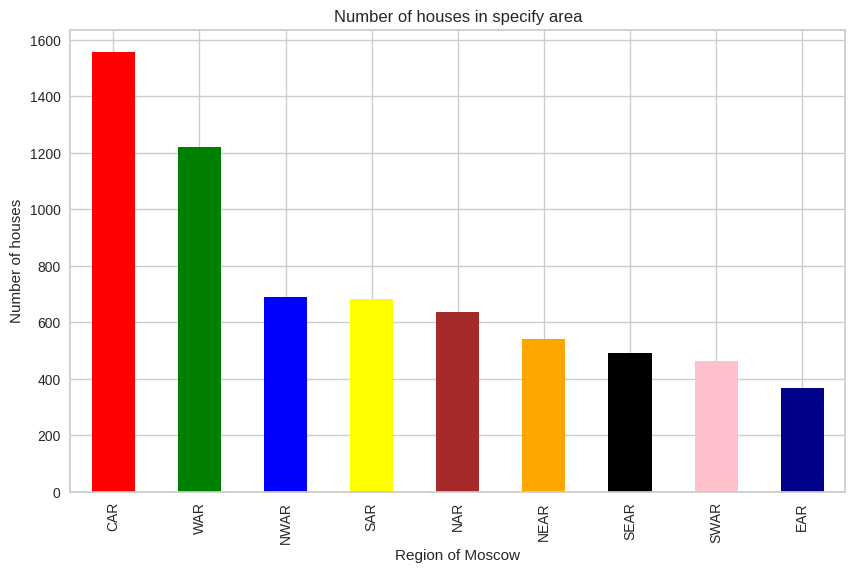

In [ ]:
colors = ['red', 'green', 'blue', 'yellow', 'brown', 'orange', 'black','pink','darkblue']
plt.figure(figsize = (10, 6))
df["region_of_moscow"].value_counts().plot(kind = 'bar',
                                          color = colors,
                                          title='Number of houses in specify area')
plt.xlabel('Region of Moscow')
plt.ylabel('Number of houses')


<ipython-input-500-02e34819a84d>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Text(0, 0.5, 'Price in USD')

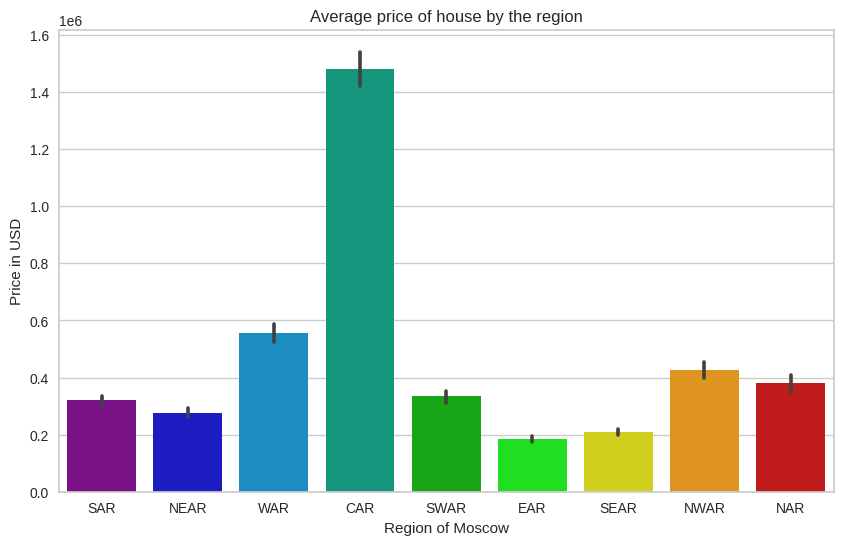

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(x = df["region_of_moscow"],
            y = df["price_USD"],
            palette = "nipy_spectral")
plt.title("Average price of house by the region")
plt.xlabel('Region of Moscow')
plt.ylabel('Price in USD')

Text(0, 0.5, 'Price in USD')

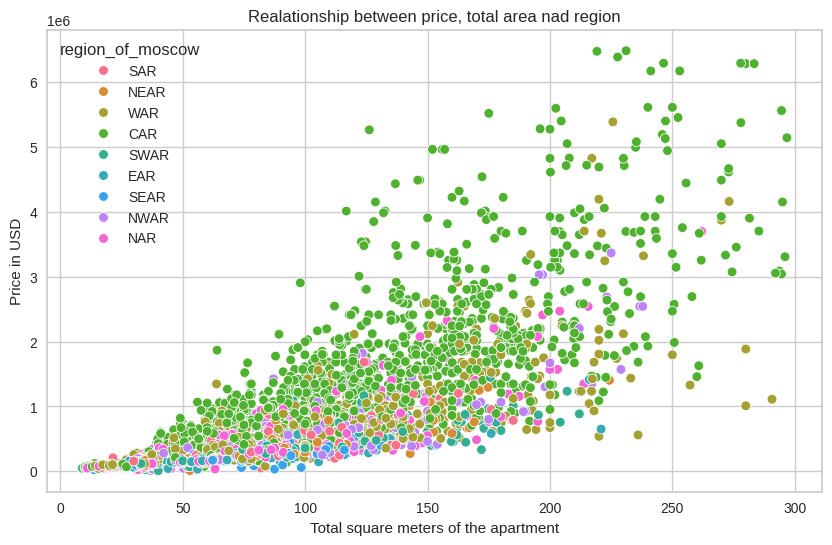

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = df,x="total_area",y="price_USD",hue="region_of_moscow")
plt.title("Realationship between price, total area nad region")
plt.xlabel('Total square meters of the apartment')
plt.ylabel('Price in USD')

Text(0.5, 1.0, 'Number of newly constructed apartments')

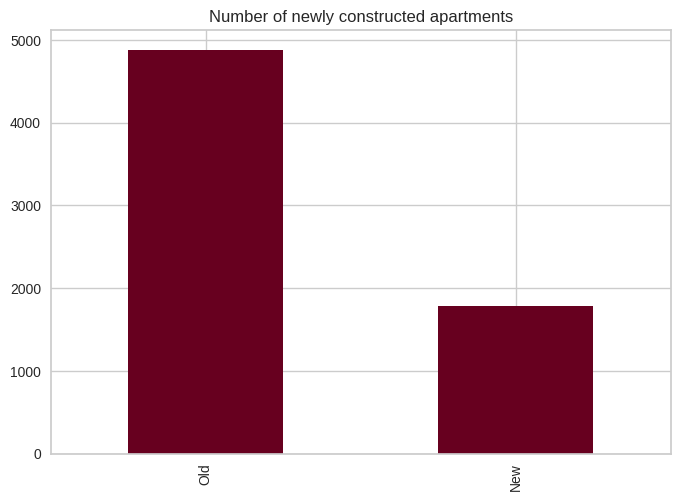

In [ ]:
is_new = df['is_new'].value_counts()
is_new.index = ['Old', 'New']
is_new.plot(kind='bar', cmap='RdGy')
plt.title("Number of newly constructed apartments")

In [ ]:
df[['is_new', 'price_USD']].groupby(by=['is_new']).mean()

,price_USD
is_new,
0.0,664408.131863
1.0,545529.405403


Text(0.5, 1.0, 'Number of apartments where you can register')

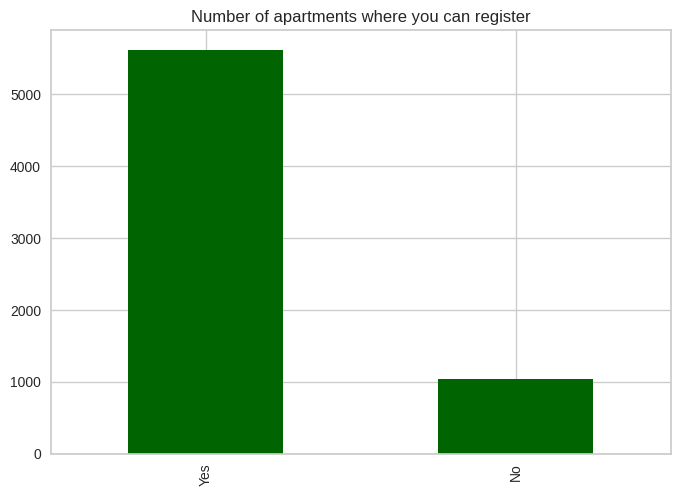

In [ ]:
is_new = df['is_apartments'].value_counts()
is_new.index = ['Yes', 'No']
is_new.plot(kind='bar', color='darkgreen')
plt.title("Number of apartments where you can register")

In [ ]:
df[['is_apartments', 'price_USD']].groupby(by=['is_apartments']).mean()

,price_USD
is_apartments,
0.0,609136.467735
1.0,758863.394492


Text(0.5, 1.0, 'Number of houses by number of rooms')

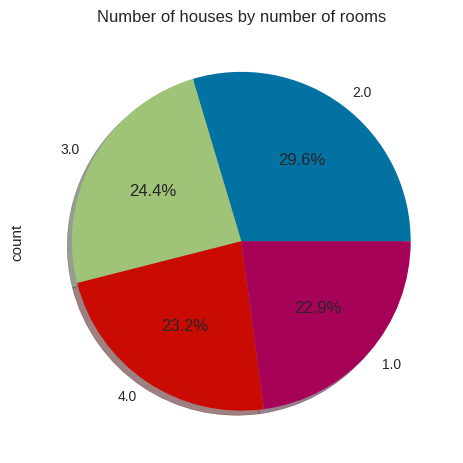

In [ ]:
df['number_of_rooms'].value_counts().plot(kind='pie', autopct='%1.1f%%',shadow=True)
plt.title("Number of houses by number of rooms")

<ipython-input-507-52111d1de748>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



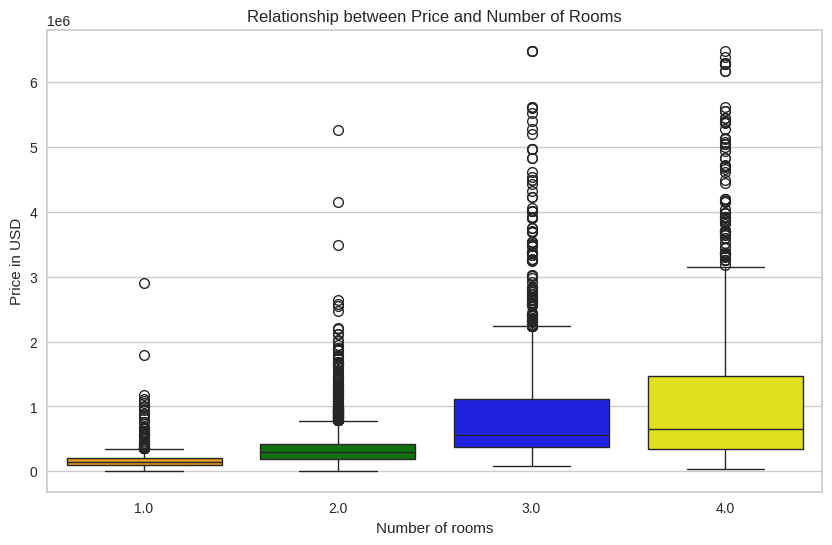

In [ ]:
colors = ['orange', 'green', 'blue', 'yellow']
plt.figure(figsize=(10, 6))
sns.boxplot(x='number_of_rooms', y='price_USD', data=df, palette=colors)
plt.title('Relationship between Price and Number of Rooms')
plt.xlabel('Number of rooms')
plt.ylabel('Price in USD')
plt.show()

Text(0.5, 1.0, 'Price of house by floor')

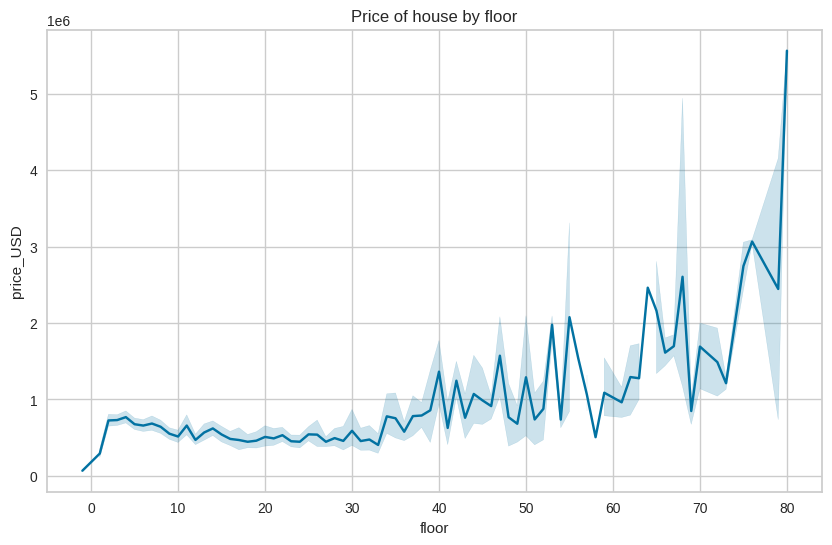

In [ ]:
plt.figure(figsize = (10, 6))
sns.lineplot(x = df["floor"],
            y = df["price_USD"])
plt.title("Price of house by floor")



In [ ]:
df_min_lower_200 = df[df['min_to_metro']<200]

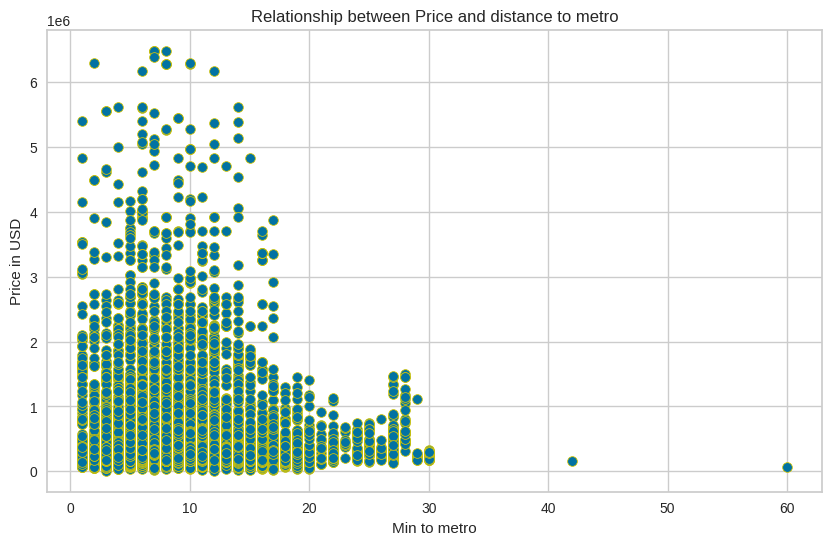

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_min_lower_200['min_to_metro'], y='price_USD', data=df,edgecolor='y')
plt.title('Relationship between Price and distance to metro')
plt.xlabel('Min to metro')
plt.ylabel('Price in USD')
plt.show()

Text(0.5, 1.0, 'Price of house by Ceiling height')

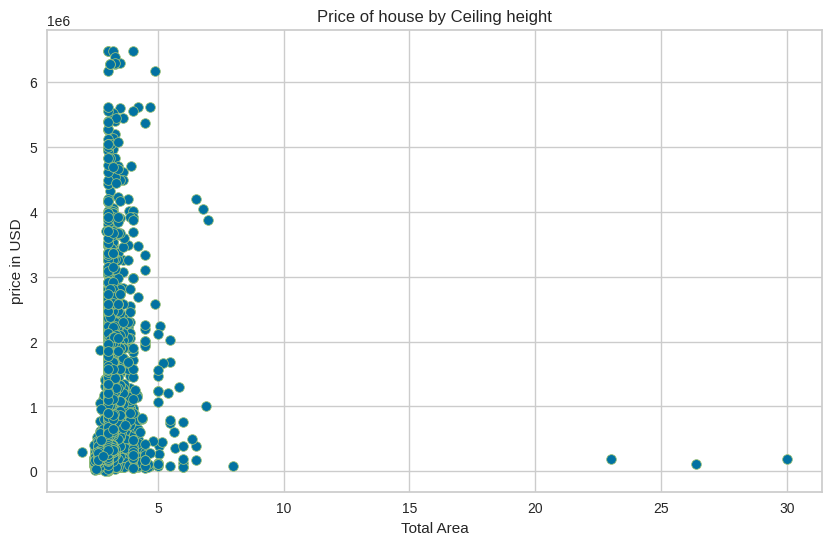

In [ ]:
plt.figure(figsize = (10, 6))
sns.scatterplot(x = df["ceiling_height"],
                y = df["price_USD"],
                edgecolor='g')
plt.xlabel('Total Area')
plt.ylabel('price in USD')
plt.title("Price of house by Ceiling height")

Text(0.5, 1.0, 'Price of house by Total Area')

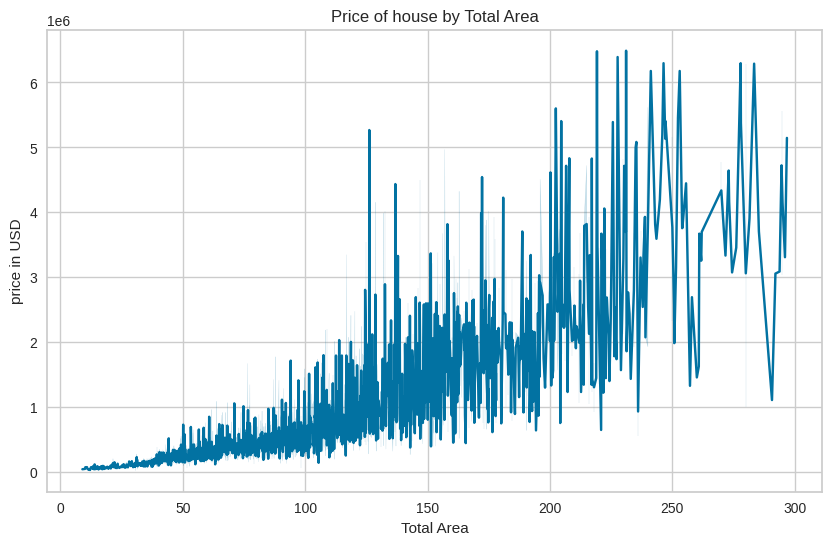

In [ ]:
plt.figure(figsize = (10, 6))
sns.lineplot(x = df["total_area"],
            y = df["price_USD"])
plt.xlabel('Total Area')
plt.ylabel('price in USD')
plt.title("Price of house by Total Area")

## Correlation

In [ ]:
corr = df.corr(numeric_only='True')

In [ ]:
plt.figure(figsize=(8,8))
corr.style.background_gradient(cmap='coolwarm')

,price_USD,min_to_metro,total_area,floor,is_new,is_apartments,ceiling_height,number_of_rooms
price_USD,1.000000,0.001012,0.794193,0.062493,-0.064768,0.066985,0.172847,0.443541
min_to_metro,0.001012,1.000000,0.004495,0.015140,0.079249,-0.004967,0.003540,-0.002848
total_area,0.794193,0.004495,1.000000,0.136907,-0.029390,0.000129,0.161195,0.744057
floor,0.062493,0.015140,0.136907,1.000000,0.222466,0.073006,0.050878,0.052172
is_new,-0.064768,0.079249,-0.029390,0.222466,1.000000,-0.010348,0.034080,-0.077083
is_apartments,0.066985,-0.004967,0.000129,0.073006,-0.010348,1.000000,0.127820,-0.111859
ceiling_height,0.172847,0.003540,0.161195,0.050878,0.034080,0.127820,1.000000,0.083776
number_of_rooms,0.443541,-0.002848,0.744057,0.052172,-0.077083,-0.111859,0.083776,1.000000


<Figure size 800x800 with 0 Axes>

## Conclusion

1. Central Administrative region has the biggest number of apartments and they are the most expensive.
2. There are more old apartments and they are more expensive than new ones.
The greatest impact of house pricing has total area.
3. We can notice more apartments where people can officialy register and price for them is higher.
3. The number of apartments divided by the number of rooms is similar ~ 20%. What is interesting, there are no apartments larger than four rooms.
4. As the number of rooms increases, the price of the apartment increases.
5. There is no correlation between the house pricing and priximity to metro station & floor & ceiling height.
6. The greatest impact of house pricing has total area.
7. There is a strong correlation between the number of rooms and total area.



# Data Preparation

## Data Split

In [ ]:
# using OHE for non-numeric columns

In [ ]:
df = pd.get_dummies(df, columns=['region_of_moscow'], dtype=int)

In [ ]:
# creating a copy of dataframe for logarithmic modeling

In [ ]:
df_log = df.copy()

In [ ]:
#choosing the target

In [ ]:
X = df.drop(columns=['price_USD'])

In [ ]:
y = df['price_USD']

In [ ]:
#split dataset into train and test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [ ]:
X_train.shape, X_test.shape

((4659, 16), (1997, 16))

In [ ]:
y_train.shape, y_test.shape

((4659,), (1997,))

## Normalization

In [ ]:
#using MinMaxScaler for scaling numerical data to a specified range

In [ ]:
scaler = MinMaxScaler()

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)

In [ ]:
X_train_scaled

array([[0.00741107, 0.07815771, 0.0617284 , ..., 0.        , 0.        ,
        0.        ],
       [0.00494071, 0.07257502, 0.04938272, ..., 0.        , 0.        ,
        0.        ],
       [0.00296443, 0.15247732, 0.14814815, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.00395257, 0.15666434, 0.03703704, ..., 0.        , 1.        ,
        0.        ],
       [0.00296443, 0.0837404 , 0.16049383, ..., 0.        , 0.        ,
        0.        ],
       [0.00148221, 0.27913468, 0.07407407, ..., 0.        , 0.        ,
        1.        ]])

In [ ]:
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_test_scaled

array([[0.00395257, 0.1388695 , 0.02469136, ..., 0.        , 0.        ,
        0.        ],
       [0.00444664, 0.09595255, 0.02469136, ..., 0.        , 0.        ,
        0.        ],
       [0.00889328, 0.21912073, 0.08641975, ..., 1.        , 0.        ,
        0.        ],
       ...,
       [0.00395257, 0.4030007 , 0.19753086, ..., 0.        , 0.        ,
        0.        ],
       [0.00494071, 0.62491277, 0.03703704, ..., 0.        , 0.        ,
        0.        ],
       [0.00543478, 0.18213538, 0.07407407, ..., 0.        , 0.        ,
        0.        ]])

# Modeling

## Linear Regression

In [ ]:
model_LR = LinearRegression()

In [ ]:
model_LR.fit(X_train_scaled, y_train)

LinearRegression()

In [ ]:
#checking coefficient and intercept

In [ ]:
model_LR.coef_

array([ 6.18461728e+04,  4.51785349e+06, -3.29146030e+05, -2.84674400e+04,
       -3.64370367e+04,  9.50632423e+05, -6.96864553e+05,  4.05027398e+05,
       -4.36455091e+04, -1.03089313e+04, -1.00095186e+05, -3.96109995e+03,
       -3.72383707e+04, -5.74418603e+04, -1.41038370e+05, -1.12980701e+04])

In [ ]:
model_LR.intercept_

-212757.42096889636

###Importance of Factors


In [ ]:
for feature, coef_ in zip(X_train.columns, model_LR.coef_):
    print(f"Factor {feature}: {coef_}")

Factor min_to_metro: 61846.17282739618
Factor total_area: 4517853.487506056
Factor floor: -329146.029896386
Factor is_new: -28467.43995907018
Factor is_apartments: -36437.03672264103
Factor ceiling_height: 950632.4233381063
Factor number_of_rooms: -696864.5533336657
Factor region_of_moscow_CAR: 405027.39807627304
Factor region_of_moscow_EAR: -43645.50912221937
Factor region_of_moscow_NAR: -10308.931320680305
Factor region_of_moscow_NEAR: -100095.18633533988
Factor region_of_moscow_NWAR: -3961.099954749923
Factor region_of_moscow_SAR: -37238.370667511146
Factor region_of_moscow_SEAR: -57441.860250960715
Factor region_of_moscow_SWAR: -141038.370333275
Factor region_of_moscow_WAR: -11298.070091538539


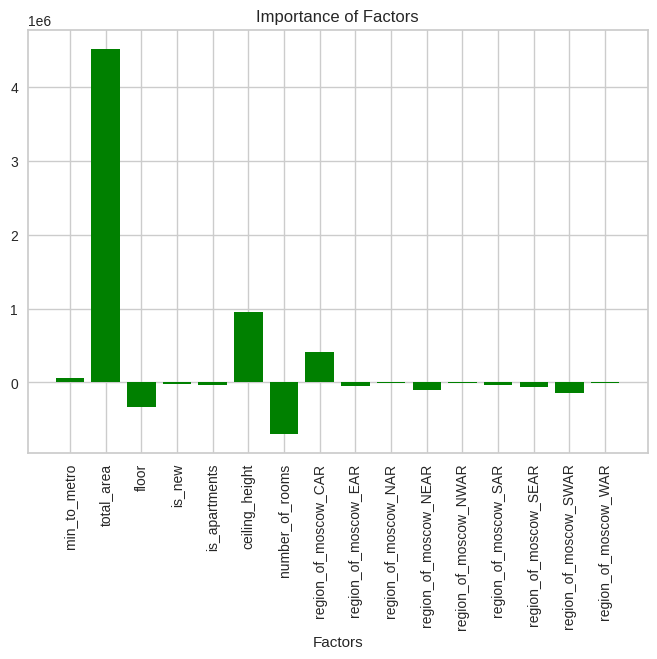

In [ ]:
plt.bar(x=X_train.columns, height = model_LR.coef_, color='green')
plt.title("Importance of Factors")
plt.xlabel ('Factors')
plt.xticks(rotation=90);

###Prediction

In [ ]:
pred_LR_train = model_LR.predict(X_train_scaled)

In [ ]:
pred_LR_train

array([110410.9123695 , 542682.69098295, 213908.27504467, ...,
       156632.98160206, 122565.08288821, 528531.95457824])

In [ ]:
y_train.values

array([ 97697.91550934, 222346.98012471, 157102.73999721, ...,
       202133.61829519,  61763.05003464, 314003.34637612])

In [ ]:
pred_LR_test = model_LR.predict(X_test_scaled)

In [ ]:
pred_LR_test

array([ 561463.34264315,  -27212.1443804 ,  480900.75782844, ...,
        996906.20605659, 2305255.75156801,  998610.53372816])

In [ ]:
y_test.values

array([ 505322.81609252,  123526.10006928,  373739.44540508, ...,
        475025.23263916, 2131515.08577511,  563861.91352287])

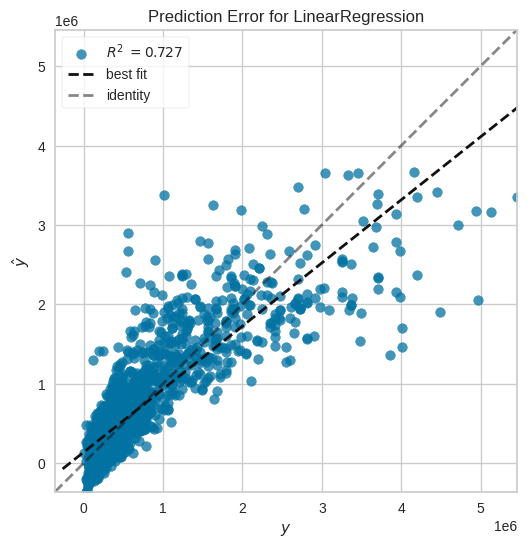

<Axes: title={'center': 'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
fig, ax = plt.subplots(figsize = (10,6))
pev = PredictionError(model_LR)
pev.fit(X_train_scaled, y_train)
pev.score(X_test_scaled, y_test)
pev.poof()

###Model Evaluation

In [ ]:
def evaluate(model, X, y, split='TEST', plot=True):
    model_pred = model.predict(X)
    mse = mean_squared_error(y, model_pred)
    rmse = mean_squared_error(y, model_pred, squared=False)
    r2 = r2_score(y, model_pred)
    print(f"MSE for {split.lower()} data: {mse}")
    print(f"RMSE for {split.lower()} data: {rmse}")
    print(f"R2 for {split.lower()} data: {r2}")

    if plot:
        plt.figure(figsize=(10, 6))
        plt.title('Actual vs. Predicted Values')
        plt.scatter(list(range(len(y))), y)
        plt.scatter(list(range(len(y))), model_pred)
        plt.xlabel(f'Number of sample {split.lower()}')
        plt.ylabel('Price')
        plt.legend(['Actual', 'Predicted'])
    return model_pred, mse, rmse, r2

**Train Data**

MSE for train data: 191097324028.35834
RMSE for train data: 437146.79917432583
R2 for train data: 0.7310411851573944


(array([110410.9123695 , 542682.69098295, 213908.27504467, ...,
        156632.98160206, 122565.08288821, 528531.95457824]),
 191097324028.35834,
 437146.79917432583,
 0.7310411851573944)

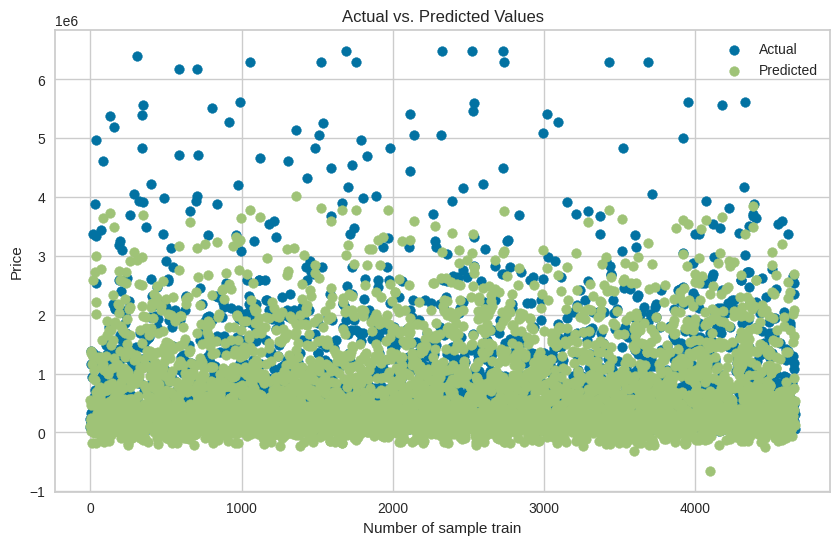

In [ ]:
evaluate(model = model_LR,
         X = X_train_scaled,
         y = y_train,
         split = 'TRAIN')

**Test Data**

MSE for test data: 148083182432.62952
RMSE for test data: 384815.77726573206
R2 for test data: 0.7267182763208888


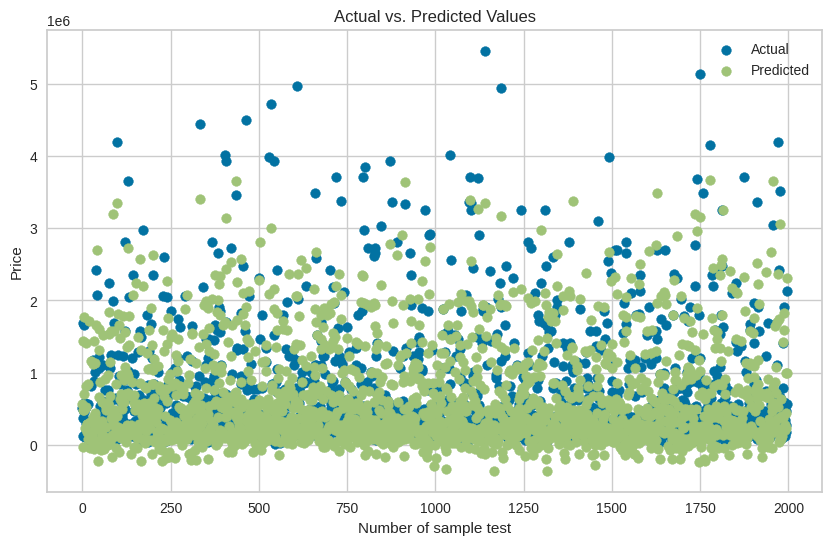

In [ ]:
LR_test_pred, mse_LR, rmse_LR, r2_LR = evaluate(model = model_LR,
                                                X = X_test_scaled,
                                                y = y_test,
                                                split = 'TEST')

##Decision Tree Regressor

In [ ]:
model_DT = DecisionTreeRegressor(random_state = 123, max_depth=5)

In [ ]:
model_DT.fit(X_train_scaled, y_train)

DecisionTreeRegressor(max_depth=5, random_state=123)

###Importance of Factors

In [ ]:
for feature, imp_ in zip(X_train.columns, model_DT.feature_importances_):
    print(f"Factor {feature}: {imp_}")

Factor min_to_metro: 0.010014606463085144
Factor total_area: 0.8438949305956949
Factor floor: 0.022969347795737685
Factor is_new: 0.0
Factor is_apartments: 0.0018451628811268672
Factor ceiling_height: 0.00672051306639985
Factor number_of_rooms: 0.005208390486686184
Factor region_of_moscow_CAR: 0.10577297627824357
Factor region_of_moscow_EAR: 0.0
Factor region_of_moscow_NAR: 0.0
Factor region_of_moscow_NEAR: 0.0
Factor region_of_moscow_NWAR: 0.0
Factor region_of_moscow_SAR: 0.0
Factor region_of_moscow_SEAR: 0.0
Factor region_of_moscow_SWAR: 0.0
Factor region_of_moscow_WAR: 0.003574072433025767


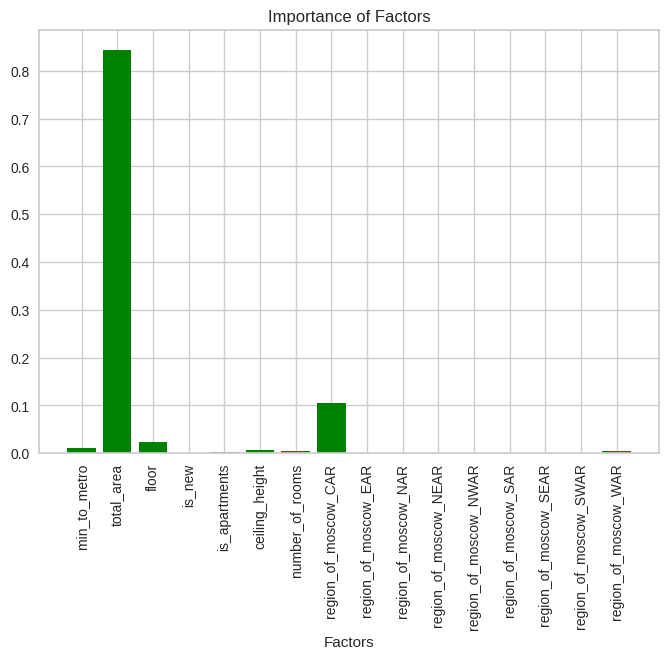

In [ ]:
plt.bar(x=X_train.columns, height = model_DT.feature_importances_, color='green')
plt.title("Importance of Factors")
plt.xlabel ('Factors')
plt.xticks(rotation=90);

###Prediction

In [ ]:
pred_DT_train = model_DT.predict(X_train_scaled)

In [ ]:
pred_DT_train

array([140139.76132456, 140139.76132456, 213323.12533041, ...,
       213323.12533041, 140139.76132456, 511220.45463646])

In [ ]:
y_train.values

array([ 97697.91550934, 222346.98012471, 157102.73999721, ...,
       202133.61829519,  61763.05003464, 314003.34637612])

In [ ]:
pred_DT_test = model_DT.predict(X_test_scaled)

In [ ]:
pred_DT_train

array([140139.76132456, 140139.76132456, 213323.12533041, ...,
       213323.12533041, 140139.76132456, 511220.45463646])

In [ ]:
y_test.values

array([ 505322.81609252,  123526.10006928,  373739.44540508, ...,
        475025.23263916, 2131515.08577511,  563861.91352287])

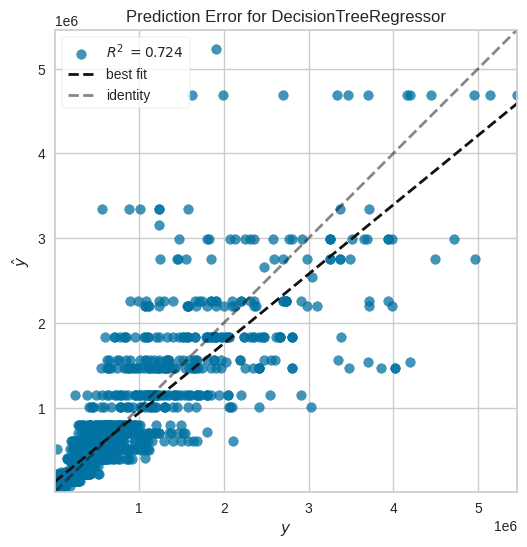

<Axes: title={'center': 'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
fig, ax = plt.subplots(figsize = (10,6))
pev = PredictionError(model_DT)
pev.fit(X_train_scaled, y_train)
pev.score(X_test_scaled, y_test)
pev.poof()

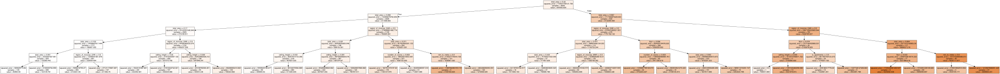

In [ ]:
dot_data = tree.export_graphviz(model_DT,
                                out_file=None,
                                filled=True,
                                feature_names = X_train.columns)

graph = graphviz.Source(dot_data)
graph

###Model Evaluation

**Train Data**

MSE for train data: 141731081778.66528
RMSE for train data: 376471.8871026963
R2 for train data: 0.8005214150675739


(array([140139.76132456, 140139.76132456, 213323.12533041, ...,
        213323.12533041, 140139.76132456, 511220.45463646]),
 141731081778.66528,
 376471.8871026963,
 0.8005214150675739)

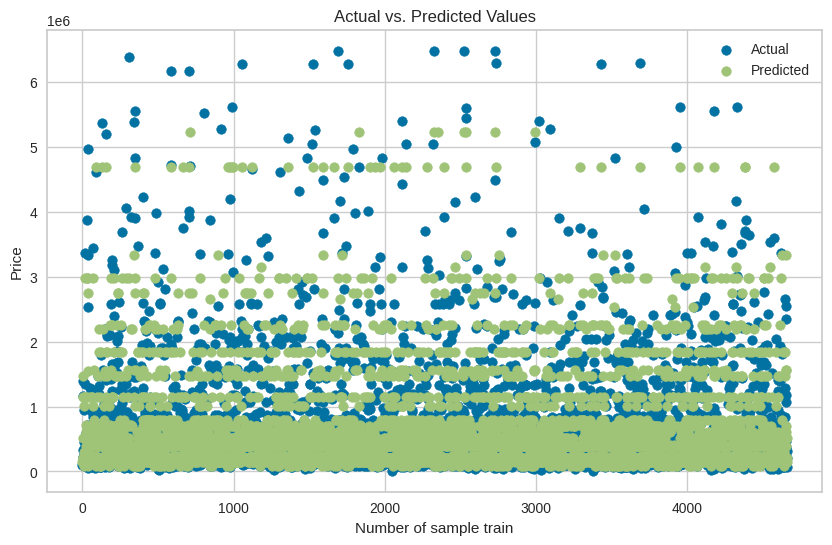

In [ ]:
evaluate(model = model_DT,
         X = X_train_scaled,
         y = y_train,
         split = 'TRAIN')

**Test Data**

MSE for test data: 149641473419.61707
RMSE for test data: 386835.2018878544
R2 for test data: 0.7238425112277709


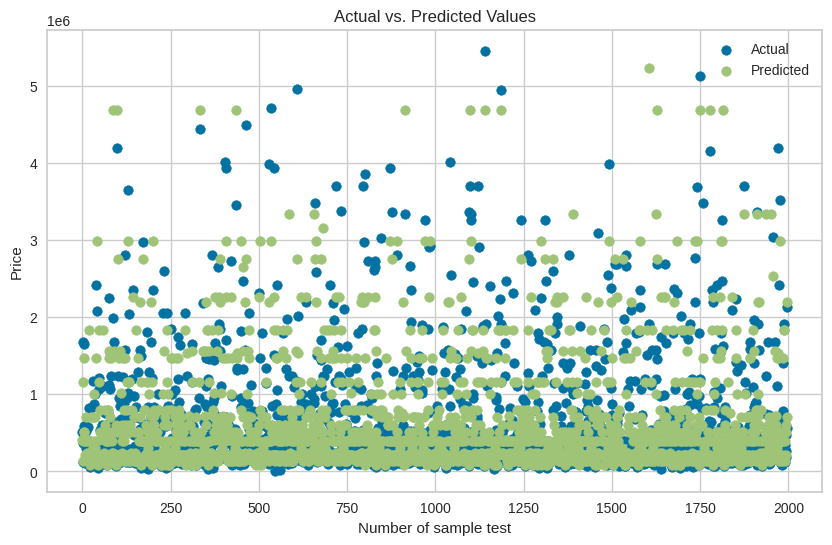

In [ ]:
DT_test_pred, mse_DT, rmse_DT, r2_DT = evaluate(model = model_DT,
                                      X = X_test_scaled,
                                      y = y_test,
                                      split = 'TEST');

###Randomized Search CV

In [ ]:
#checking the best parameters for Decision Tree

In [ ]:
params_gs = {
    'max_depth': range(1, 20),
    'min_samples_split': range(2, 20),
    'min_samples_leaf': range(1, 20),
    'max_features': ['auto', 'sqrt']
}

In [ ]:
dtree_reg = DecisionTreeRegressor(random_state=123)

In [ ]:
random_search = RandomizedSearchCV(dtree_reg, param_distributions=params_gs,
                                   n_iter=100, cv=5, random_state=123)

In [ ]:
random_search.fit(X_train_scaled, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_featur

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=123),
                   n_iter=100,
                   param_distributions={'max_depth': range(1, 20),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': range(1, 20),
                                        'min_samples_split': range(2, 20)},
                   random_state=123)

In [ ]:
random_search.best_estimator_

DecisionTreeRegressor(max_depth=15, max_features='auto', min_samples_leaf=12,
                      min_samples_split=13, random_state=123)

In [ ]:
random_search.best_score_

0.7483793994968035

#### Best Model Evaluation

MSE for train data: 112872943660.88638
RMSE for train data: 335965.68821962515
R2 for train data: 0.8411376333541796


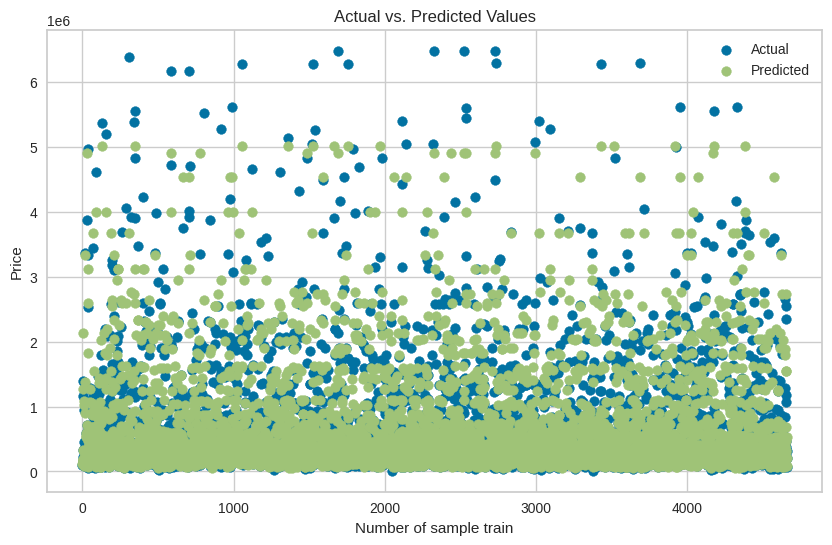

In [ ]:
GS_DT_train_pred = evaluate(model = random_search.best_estimator_,
                            X = X_train_scaled,
                            y = y_train,
                            split = 'TRAIN')

MSE for test data: 142693903028.73126
RMSE for test data: 377748.46528971003
R2 for test data: 0.7366639807600524


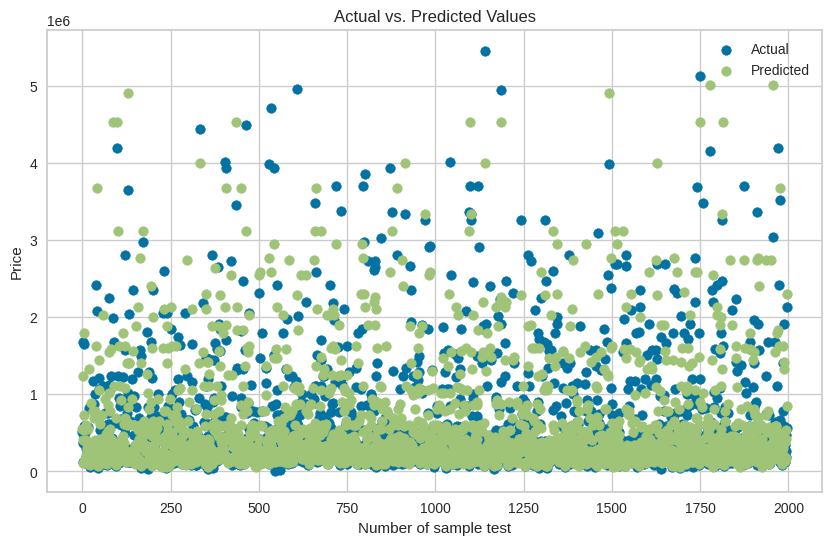

In [ ]:
DT_test_pred_BP, mse_DT_BP, rmse_DT_BP, r2_DT_BP = evaluate(model = random_search.best_estimator_,
                                                            X = X_test_scaled,
                                                            y = y_test,
                                                            split = 'TEST')

## Random Forest Regressor

In [ ]:
model_RF = RandomForestRegressor(n_estimators=30,
                                 max_depth=3,
                                 random_state=123)

In [ ]:
model_RF.fit(X_train_scaled, y_train)

RandomForestRegressor(max_depth=3, n_estimators=30, random_state=123)

### Importance of Factors

In [ ]:
for feature, imp_ in zip(X_train.columns, model_RF.feature_importances_):
    print(f"Factor {feature}: {imp_}")

Factor min_to_metro: 0.0
Factor total_area: 0.8985184790208807
Factor floor: 0.00817579987136413
Factor is_new: 0.0
Factor is_apartments: 0.0
Factor ceiling_height: 0.0
Factor number_of_rooms: 0.0
Factor region_of_moscow_CAR: 0.09330572110775529
Factor region_of_moscow_EAR: 0.0
Factor region_of_moscow_NAR: 0.0
Factor region_of_moscow_NEAR: 0.0
Factor region_of_moscow_NWAR: 0.0
Factor region_of_moscow_SAR: 0.0
Factor region_of_moscow_SEAR: 0.0
Factor region_of_moscow_SWAR: 0.0
Factor region_of_moscow_WAR: 0.0


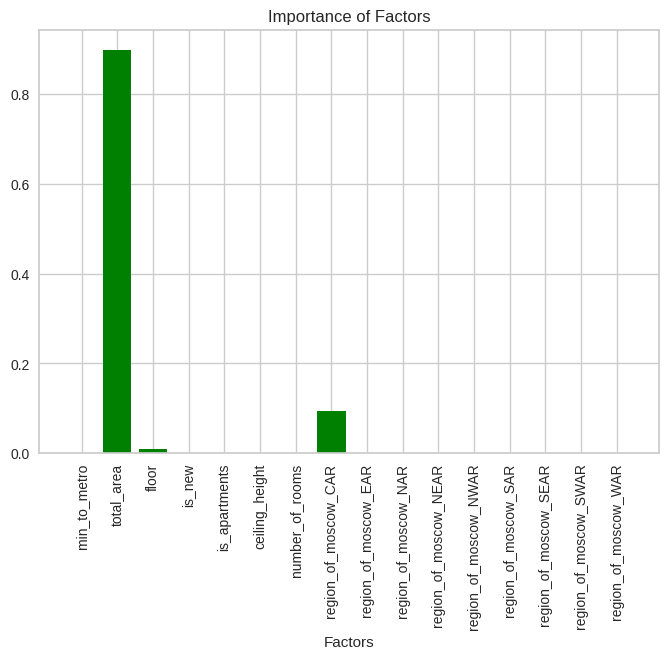

In [ ]:
plt.bar(x=X_train.columns, height = model_RF.feature_importances_,color='green')
plt.title("Importance of Factors")
plt.xlabel ('Factors')
plt.xticks(rotation=90);

###Prediction

In [ ]:
pred_RF_train = model_RF.predict(X_train_scaled)

In [ ]:
pred_RF_train

array([183811.86038231, 183811.86038231, 200212.08197166, ...,
       207034.4375682 , 183811.86038231, 513936.43722187])

In [ ]:
y_train.values

array([ 97697.91550934, 222346.98012471, 157102.73999721, ...,
       202133.61829519,  61763.05003464, 314003.34637612])

In [ ]:
pred_RF_test = model_RF.predict(X_test_scaled)

In [ ]:
y_test.values

array([ 505322.81609252,  123526.10006928,  373739.44540508, ...,
        475025.23263916, 2131515.08577511,  563861.91352287])

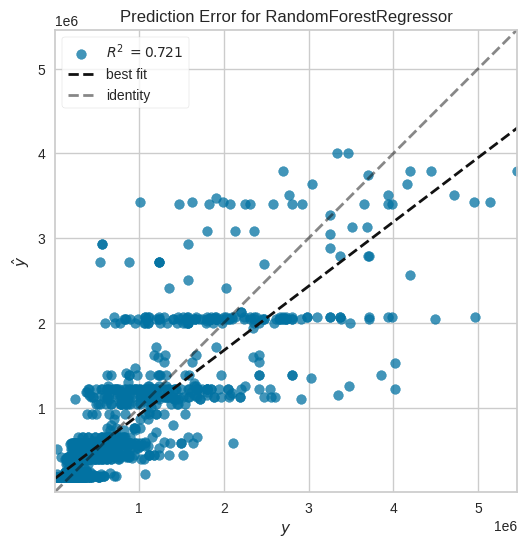

<Axes: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
fig, ax = plt.subplots(figsize = (10,6))
pev = PredictionError(model_RF)
pev.fit(X_train_scaled, y_train)
pev.score(X_test_scaled, y_test)
pev.poof()

### Model Evaluation

**Train Data**

MSE for train data: 178995853092.67316
RMSE for train data: 423079.0151882662
R2 for train data: 0.7480733298892124


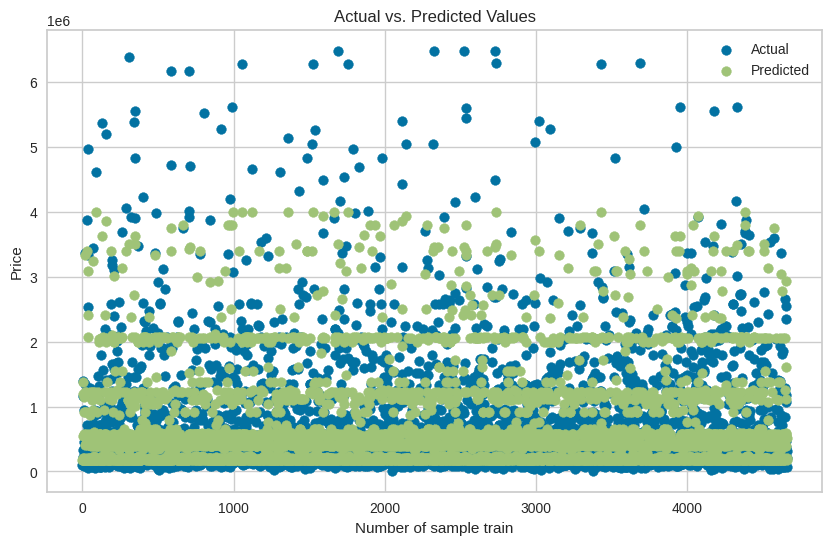

In [ ]:
RF_train_pred = evaluate(model = model_RF,
                         X = X_train_scaled,
                         y = y_train,
                         split = 'TRAIN')

**Test Data**

MSE for test data: 151268529761.07764
RMSE for test data: 388932.55168612156
R2 for test data: 0.7208398423614418


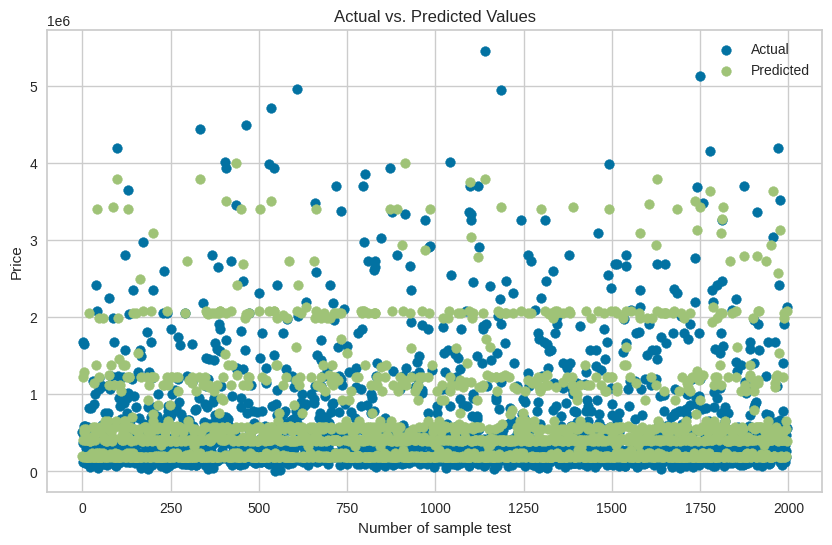

In [ ]:
RF_test_pred, mse_RF, rmse_RF, r2_RF = evaluate( model = model_RF,
                                                X = X_test_scaled,
                                                y = y_test,
                                                split = 'TEST')

### Grid Search

In [ ]:
#checking the best parameters for Random Forest

In [ ]:
params = {
    "n_estimators": [5, 20, 45, 100],
    "max_depth": [1, 5, 10],
    "min_samples_split": [2, 5],
    "criterion": ["squared_error", "absolute_error"],
    "random_state": [123]
}


In [ ]:
RF_GridS = RandomForestRegressor()

In [ ]:
GS = GridSearchCV(estimator=RF_GridS,
                  param_grid=params,
                  scoring='r2',
                  cv=5,
                  verbose=2)

In [ ]:
GS.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=5, random_state=123; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=5, random_state=123; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=5, random_state=123; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=5, random_state=123; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=5, random_state=123; total time=   0.0s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=20, random_state=123; total time=   0.1s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=20, random_state=123; total time=   0.1s
[CV] END criterion=squared_error, max_depth=1, min_samples_split=2, n_estimators=20, rand

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [1, 5, 10], 'min_samples_split': [2, 5],
                         'n_estimators': [5, 20, 45, 100],
                         'random_state': [123]},
             scoring='r2', verbose=2)

In [ ]:
GS.best_estimator_

RandomForestRegressor(max_depth=10, random_state=123)

In [ ]:
GS.best_params_

{'criterion': 'squared_error',
 'max_depth': 10,
 'min_samples_split': 2,
 'n_estimators': 100,
 'random_state': 123}

In [ ]:
GS.best_score_

0.7920261923395678

#### Best Model Evaluation

MSE for train data: 38849028308.52673
RMSE for train data: 197101.5685085401
R2 for train data: 0.9453221615489622


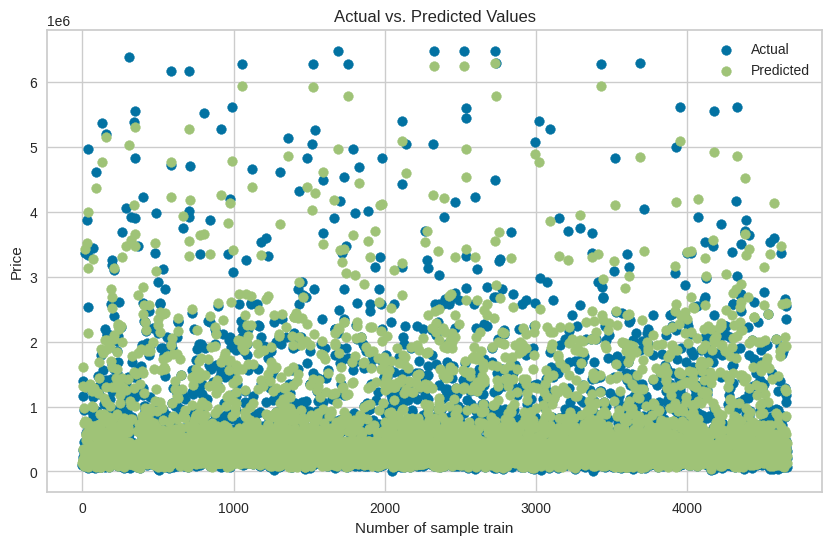

In [ ]:
GS_RF_train_pred = evaluate(model = GS.best_estimator_,
                            X = X_train_scaled,
                            y = y_train,
                            split = 'TRAIN')

MSE for test data: 117408594153.80531
RMSE for test data: 342649.37495026214
R2 for test data: 0.7833270297274271


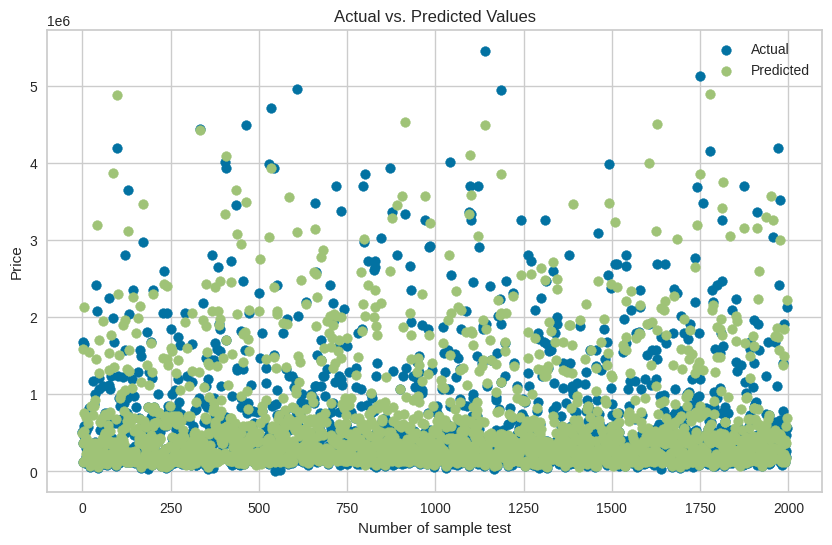

In [ ]:
GS_RF_test_pred, mse_RF_BP, rmse_RF_BP, r2_RF_BP = evaluate(model = GS.best_estimator_,
                                                            X = X_test_scaled,
                                                            y = y_test,
                                                            split = 'TEST')

##Logarithm - normal distribution

In [ ]:
#checking if the logarithm can improve model

In [ ]:
df_log['price_USD_log'] = np.log(df_log['price_USD'])

In [ ]:
# comparing histograms before and after logarithm

array([[<Axes: title={'center': 'price_USD'}>,
        <Axes: title={'center': 'price_USD_log'}>]], dtype=object)

<Figure size 1500x1500 with 0 Axes>

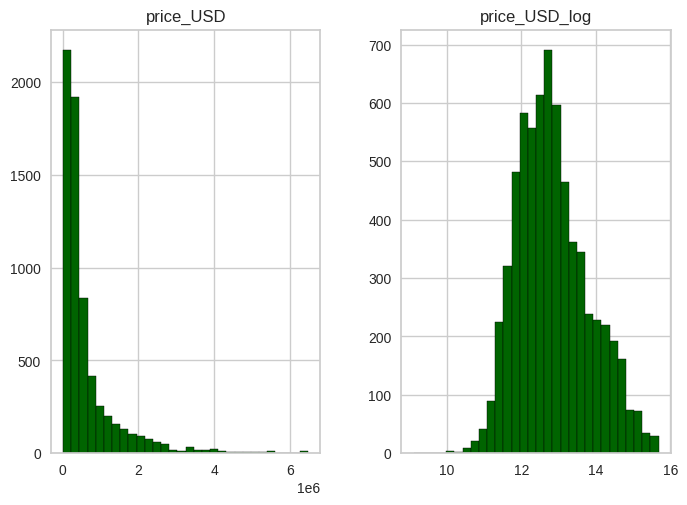

In [ ]:
plt.figure(figsize=(15, 15))
df_log[['price_USD', 'price_USD_log']].hist(bins=30, color = 'darkgreen' , edgecolor = 'black')

In [ ]:
# checking the outliers after logarithm

<Axes: >

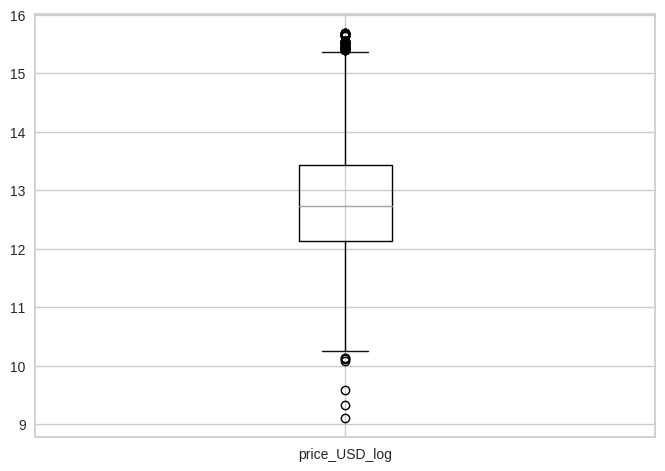

In [ ]:
df_log[['price_USD_log']].boxplot()

In [ ]:
# preparing data for modeling

In [ ]:
df_log = df_log.drop(columns=['price_USD'])

In [ ]:
df_log.rename(columns = {'price_USD_log': 'price_USD'}, inplace=True)

In [ ]:
df['price_USD'].describe()

count    6.656000e+03
mean     6.325988e+05
std      8.126120e+05
min      8.983716e+03
25%      1.848198e+05
50%      3.374866e+05
75%      6.809724e+05
max      6.487928e+06
Name: price_USD, dtype: float64

In [ ]:
X = df_log.drop(columns=['price_USD'])
y = df_log['price_USD']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [ ]:
# Standarization

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
def evaluate(model, X, y, split='TEST', plot=True):
    model_pred = model.predict(X)
    mse = mean_squared_error(np.exp(y), np.exp(model_pred))
    rmse = mean_squared_error(np.exp(y), np.exp(model_pred), squared=False)
    r2 = r2_score(np.exp(y), np.exp(model_pred))
    print(f"MSE for {split.lower()} data: {mse}")
    print(f"RMSE for {split.lower()} data: {rmse}")
    print(f"R2 for {split.lower()} data: {r2}")

    if plot:
        plt.figure(figsize=(10, 6))
        plt.title('Actual vs. Predicted Values')
        plt.scatter(list(range(len(y))), np.exp(y))
        plt.scatter(list(range(len(y))), np.exp(model_pred))
        plt.xlabel(f'Number of sample {split.lower()}')
        plt.ylabel('Price')
        plt.legend(['Actual', 'Predicted'])
    return model_pred, mse, rmse, r2

In [ ]:
model_RF_log = RandomForestRegressor(n_estimators=100,
                                     max_depth=10,
                                     min_samples_split=2,
                                     random_state=123,
                                     criterion="squared_error")

In [ ]:
model_RF_log.fit(X_train_scaled, y_train)

RandomForestRegressor(max_depth=10, random_state=123)

###Importance of Factors

In [ ]:
for feature, imp_ in zip(X_train.columns, model_RF_log.feature_importances_):
    print(f"Factor {feature}: {imp_}")

Factor min_to_metro: 0.01459786672741131
Factor total_area: 0.7947328246194943
Factor floor: 0.01883541380464372
Factor is_new: 0.003966590151029169
Factor is_apartments: 0.0034663196823969465
Factor ceiling_height: 0.04379134351789337
Factor number_of_rooms: 0.010896769778842907
Factor region_of_moscow_CAR: 0.09626015407026768
Factor region_of_moscow_EAR: 0.001473533548994741
Factor region_of_moscow_NAR: 0.0015027940449286268
Factor region_of_moscow_NEAR: 0.001279823924656005
Factor region_of_moscow_NWAR: 0.0009079156096247356
Factor region_of_moscow_SAR: 0.000509899023949017
Factor region_of_moscow_SEAR: 0.0023965981829220675
Factor region_of_moscow_SWAR: 0.0013214781452231311
Factor region_of_moscow_WAR: 0.004060675167722193


###Model Evaluation

MSE for train data: 55647313697.716866
RMSE for train data: 235896.82850287933
R2 for train data: 0.9216795126911793


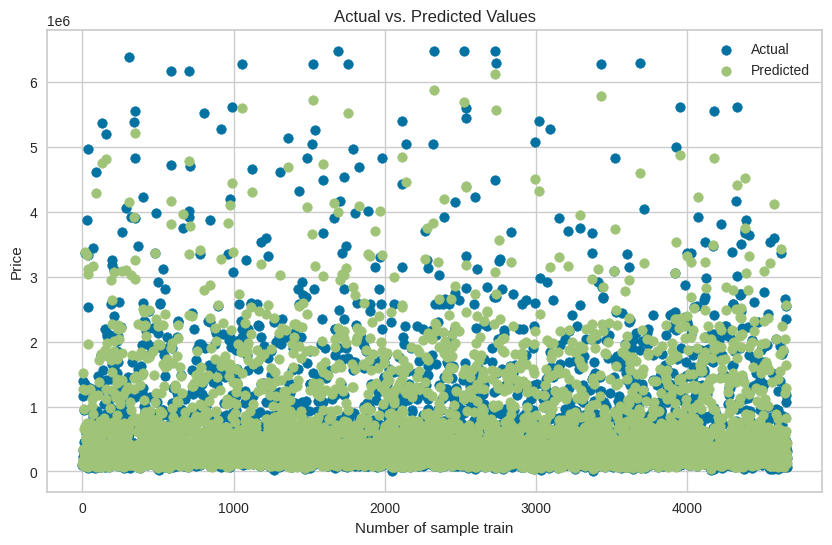

In [ ]:
RF_train_log = evaluate(model = model_RF_log,
                              X = X_train_scaled,
                              y = y_train,
                              split = 'TRAIN')

MSE for test data: 105715644981.65631
RMSE for test data: 325139.42391173716
R2 for test data: 0.8049059102739125


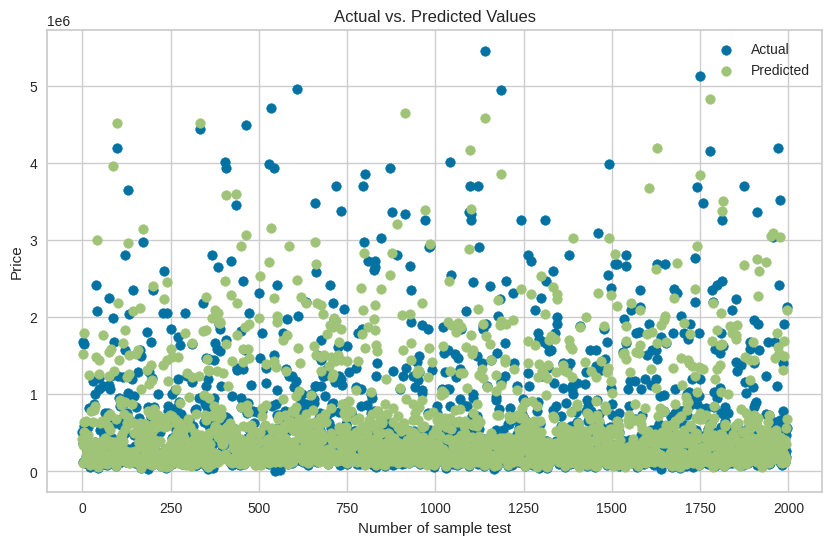

In [ ]:
RF_test_log, mse_RF_log, rmse_RF_log, r2_RF_log = evaluate( model = model_RF_log,
                                                X = X_test_scaled,
                                                y = y_test,
                                                split = 'TEST')

#Conclusion

In [ ]:
results = {"Model": ["Linear Regression", "Decision Tree","Decision Tree Best Model", "Random Forest","Random Forest Best Model", "Random Forest Logarithm"],
           "MSE": [mse_LR, mse_DT, mse_DT_BP, mse_RF, mse_RF_BP,mse_RF_log],
           "RMSE": [rmse_LR, rmse_DT, rmse_DT_BP, rmse_RF, rmse_RF_BP,rmse_RF_log],
           "r2 score": [r2_LR, r2_DT, r2_DT_BP, r2_RF, r2_RF_BP,r2_RF_log]
          }

In [ ]:
df_results = pd.DataFrame(results)

In [ ]:
df_results.set_index("Model")

,MSE,RMSE,r2 score
Model,,,
Linear Regression,1.480832e+11,384815.777266,0.726718
Decision Tree,1.496415e+11,386835.201888,0.723843
Decision Tree Best Model,1.426939e+11,377748.465290,0.736664
Random Forest,1.512685e+11,388932.551686,0.720840
Random Forest Best Model,1.174086e+11,342649.374950,0.783327
Random Forest Logarithm,1.057156e+11,325139.423912,0.804906


<ipython-input-617-44cbb137ba86>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



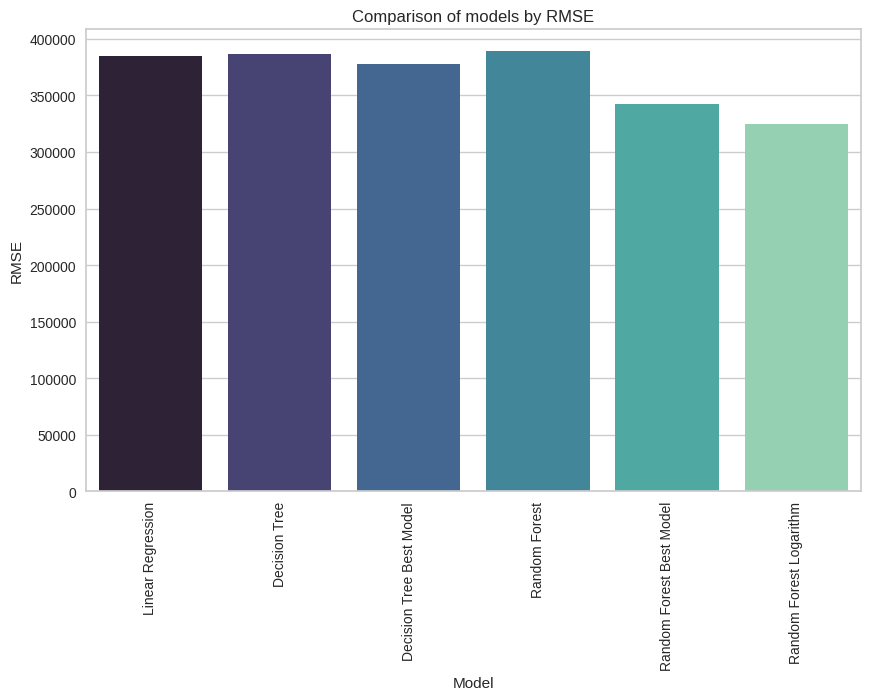

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(x = df_results["Model"],
            y = df_results["RMSE"],
            palette='mako')
plt.title('Comparison of models by RMSE')
plt.xticks(rotation=90);

<ipython-input-618-36c0af3ef3cf>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



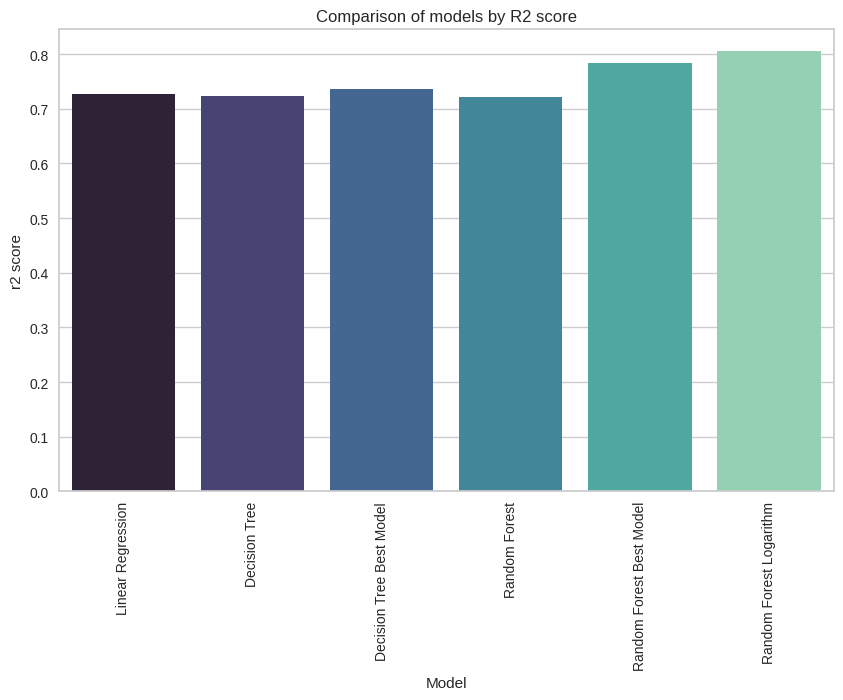

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(x = df_results["Model"],
            y = df_results["r2 score"],
            palette='mako')
plt.title('Comparison of models by R2 score')
plt.xticks(rotation=90);



---


I used six models to compare which one provided the best results for my
prediction. I started with Linear Regression and Decion Tree. The results  of these two were quite similar. Then, I decided to use Randomize Search to find the best paremeters for the Decion Tree. This improved R2 score by 0.013 and RMSE by 9,087 USD. Next I focused on Random Forest. Grid Search helped to find the best parameters for it and improved R2 score by 0.06 and RMSE by 46,283USD. At the end I checked (in a separate notebook) how all models performed if I used logarithms. This improved the result only for Random Forest with best parameters so I added it as a seperate model. In conclusion, the final best R2 score is 0.805 and the best model is Random Forest after using Grid Search and Logartithm. However, the RMSE for this case is still 325,139 USD so it is pretty hight :) Maybe it would be a good idea to use PCA for this data. Checking the results I can also reject the null hypothesis as we can notice linear relationship between price and variable.